In [22]:
# install.packages("ranger")
# install.packages("tidymodels")
# install.packages("vip")
# install.packages("broom")


The downloaded binary packages are in
	/var/folders/w8/tbzt4_bn1xvdtgr4kf64yrcw0000gn/T//Rtmp4spr7y/downloaded_packages


also installing the dependencies ‘sfd’, ‘sparsevctrs’, ‘doFuture’, ‘broom’, ‘cli’, ‘dials’, ‘ggplot2’, ‘hardhat’, ‘infer’, ‘modeldata’, ‘parsnip’, ‘purrr’, ‘recipes’, ‘rlang’, ‘rsample’, ‘rstudioapi’, ‘tune’, ‘workflows’, ‘workflowsets’, ‘yardstick’




In [36]:
library(ranger)
library(tidyverse)
library(tidymodels)
library(vip)
library(broom)

In [4]:
heart = read_csv('../DataSets/heart_data.csv')
heart = heart %>%
  mutate(
    sex = as.factor(sex),
    chest_pain = as.factor(chest_pain),
    fbs = as.factor(fbs),
    ex_ang = as.factor(ex_ang),
    thal = as.factor(thal),
    ahd = as.factor(ahd),
  )
glimpse(heart)

New names:
• `` -> `...1`
Rows: 303 Columns: 15
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (6): sex, chest_pain, fbs, ex_ang, thal, ahd
dbl (9): ...1, age, rest_bp, chol, rest_ecg, max_hr, oldpeak, slope, ca

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Rows: 303
Columns: 15
$ ...1       <dbl> 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, …
$ age        <dbl> 63, 67, 67, 37, 41, 56, 62, 57, 63, 53, 57, 56, 56, 44, 52,…
$ sex        <fct> Male, Male, Male, Male, Female, Male, Female, Female, Male,…
$ chest_pain <fct> typical, asymptomatic, asymptomatic, nonanginal, nontypical…
$ rest_bp    <dbl> 145, 160, 120, 130, 130, 120, 140, 120, 130, 140, 140, 140,…
$ chol       <dbl> 233, 286, 229, 250, 204, 236, 268, 354, 254, 203, 192, 294,…
$ fbs        <fct> Yes, No, No, No, No, No, No, No, No, Yes, No, No, Yes, No, …
$ rest_ecg   <dbl> 2, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0,…
$ max_hr     <dbl> 150, 108, 129, 187, 172, 178, 160, 163, 147, 155, 148, 153,…
$ ex_ang     <fct> No, Yes, Yes, No, No, No, No, Yes, No, Yes, No, No, Yes, No…
$ oldpeak    <dbl> 2.3, 1.5, 2.6, 3.5, 1.4, 0.8, 3.6, 0.6, 1.4, 3.1, 0.4, 1.3,…
$ slope      <dbl> 3, 2, 2, 3, 1, 1, 3, 1, 2, 3, 2, 2, 2, 1, 1, 1, 3, 1, 1, 1,…
$ ca         <dbl>

In [37]:
any(is.na(heart))

[1] TRUE

**Task1 load car prices data**

In [5]:
set.seed(1234)
splits   <- initial_split(heart, prop = 0.75, strata = ahd)
train_tbl <- training(splits)
test_tbl  <- testing(splits)

### Main split of the data   

In [6]:
train_tbl

...1,age,sex,chest_pain,rest_bp,chol,fbs,rest_ecg,max_hr,ex_ang,oldpeak,slope,ca,thal,ahd
<dbl>,<dbl>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<fct>
4,37,Male,nonanginal,130,250,No,0,187,No,3.5,3,0,normal,No
5,41,Female,nontypical,130,204,No,2,172,No,1.4,1,0,normal,No
6,56,Male,nontypical,120,236,No,0,178,No,0.8,1,0,normal,No
11,57,Male,asymptomatic,140,192,No,0,148,No,0.4,2,0,fixed,No
14,44,Male,nontypical,120,263,No,0,173,No,0.0,1,0,reversable,No
15,52,Male,nonanginal,172,199,Yes,0,162,No,0.5,1,0,reversable,No
16,57,Male,nonanginal,150,168,No,0,174,No,1.6,1,0,normal,No
18,54,Male,asymptomatic,140,239,No,0,160,No,1.2,1,0,normal,No
21,64,Male,typical,110,211,No,2,144,Yes,1.8,2,0,normal,No


In [7]:
test_tbl

...1,age,sex,chest_pain,rest_bp,chol,fbs,rest_ecg,max_hr,ex_ang,oldpeak,slope,ca,thal,ahd
<dbl>,<dbl>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<fct>,<fct>
1,63,Male,typical,145,233,Yes,2,150,No,2.3,3,0,fixed,No
8,57,Female,asymptomatic,120,354,No,0,163,Yes,0.6,1,0,normal,No
10,53,Male,asymptomatic,140,203,Yes,2,155,Yes,3.1,3,0,reversable,Yes
12,56,Female,nontypical,140,294,No,2,153,No,1.3,2,0,normal,No
19,48,Female,nonanginal,130,275,No,0,139,No,0.2,1,0,normal,No
20,49,Male,nontypical,130,266,No,0,171,No,0.6,1,0,normal,No
22,58,Female,typical,150,283,Yes,2,162,No,1.0,1,0,normal,No
24,58,Male,nonanginal,132,224,No,2,173,No,3.2,1,2,reversable,Yes
28,66,Female,typical,150,226,No,0,114,No,2.6,3,0,normal,No


**Task2 create train test split**

### The recipe for data preparation - not all steps (in the following recipe) are really necessary

In [8]:
the_recipe <- recipe(ahd ~ ., data = train_tbl) %>%
    step_impute_knn(all_predictors(), neighbors = 3) %>%   # .missing values impoutation
    step_dummy(all_nominal(), -all_outcomes()) %>% # dummification of the predictors
    step_zv(all_predictors()) # this removes predictors with zero variance

**Task3 create the recipe**

(3 steps - data dummyfication, missing data imputation, drop zero variance columns)

### Models Specification

In [9]:
lr_spec <- logistic_reg(mode = "classification") %>%
          set_engine("glm")

rf_spec <- rand_forest() %>%
     set_engine("ranger") %>%
     set_mode("classification")

**Task4 create linear regression specs**

**Task5 create rf specs**

### Assemble the workflows and fit the models

In [10]:
set.seed(1234)
lr_fit <- workflow() %>%
    add_recipe(the_recipe) %>%
    add_model(lr_spec) %>%
    fit(data = train_tbl)

# examine the resulted tibble
lr_fit

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: logistic_reg()

── Preprocessor ────────────────────────────────────────────────────────────────
3 Recipe Steps

• step_impute_knn()
• step_dummy()
• step_zv()

── Model ───────────────────────────────────────────────────────────────────────

Call:  stats::glm(formula = ..y ~ ., family = stats::binomial, data = data)

Coefficients:
          (Intercept)                   ...1                    age  
            -4.871274               0.001654               0.003476  
              rest_bp                   chol               rest_ecg  
             0.010672               0.008134               0.367944  
               max_hr                oldpeak                  slope  
            -0.015204               0.290551               0.722264  
                   ca               sex_Male  chest_pain_nonanginal  
             1.074063               1.752365              -1.808736

**Task6 create the workflow and fit lr model**

In [11]:
lr_fit_summary <- broom::glance(lr_fit)
lr_fit_summary

null.deviance,df.null,logLik,AIC,BIC,deviance,df.residual,nobs
<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
313.0966,226,-79.3699,194.7398,256.3889,158.7398,209,227


In [12]:
# raw coefficients
lr_fit_coefficients <- broom::tidy(lr_fit)
# ..or...
lr_fit_coefficients2 <- tidy(extract_fit_parsnip(lr_fit))

In [13]:
lr_fit_coefficients
lr_fit_coefficients2

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),-4.871273931,3.206932062,-1.5189826,0.1287668814
...1,0.001654401,0.002453137,0.6744020,0.5000557774
age,0.003475512,0.026904347,0.1291803,0.8972149672
rest_bp,0.010672042,0.012550856,0.8503039,0.3951561276
chol,0.008134139,0.004271683,1.9042000,0.0568841396
rest_ecg,0.367944127,0.216441807,1.6999679,0.0891369603
max_hr,-0.015203677,0.012159196,-1.2503851,0.2111589142
oldpeak,0.290551044,0.260363347,1.1159445,0.2644458931
slope,0.722264109,0.436024637,1.6564755,0.0976255715


term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),-4.871273931,3.206932062,-1.5189826,0.1287668814
...1,0.001654401,0.002453137,0.6744020,0.5000557774
age,0.003475512,0.026904347,0.1291803,0.8972149672
rest_bp,0.010672042,0.012550856,0.8503039,0.3951561276
chol,0.008134139,0.004271683,1.9042000,0.0568841396
rest_ecg,0.367944127,0.216441807,1.6999679,0.0891369603
max_hr,-0.015203677,0.012159196,-1.2503851,0.2111589142
oldpeak,0.290551044,0.260363347,1.1159445,0.2644458931
slope,0.722264109,0.436024637,1.6564755,0.0976255715


In [14]:
# exponentiated coefficients
lr_fit_coefficients_exp <- broom::tidy (lr_fit, exponentiate = TRUE)
# ..or...
coeffs_exp <- tidy(extract_fit_parsnip(lr_fit), exponentiate = TRUE)

lr_fit_coefficients_exp
coeffs_exp

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),0.007663596,3.206932062,-1.5189826,0.1287668814
...1,1.001655770,0.002453137,0.6744020,0.5000557774
age,1.003481559,0.026904347,0.1291803,0.8972149672
rest_bp,1.010729192,0.012550856,0.8503039,0.3951561276
chol,1.008167311,0.004271683,1.9042000,0.0568841396
rest_ecg,1.444761314,0.216441807,1.6999679,0.0891369603
max_hr,0.984911316,0.012159196,-1.2503851,0.2111589142
oldpeak,1.337164121,0.260363347,1.1159445,0.2644458931
slope,2.059089942,0.436024637,1.6564755,0.0976255715


term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),0.007663596,3.206932062,-1.5189826,0.1287668814
...1,1.001655770,0.002453137,0.6744020,0.5000557774
age,1.003481559,0.026904347,0.1291803,0.8972149672
rest_bp,1.010729192,0.012550856,0.8503039,0.3951561276
chol,1.008167311,0.004271683,1.9042000,0.0568841396
rest_ecg,1.444761314,0.216441807,1.6999679,0.0891369603
max_hr,0.984911316,0.012159196,-1.2503851,0.2111589142
oldpeak,1.337164121,0.260363347,1.1159445,0.2644458931
slope,2.059089942,0.436024637,1.6564755,0.0976255715


### Model predictions on the training set


In [15]:
# with `broom`, we get predictions as both classes and probabilities...
lr_fit_predictions <- broom::augment(lr_fit, new_data = train_tbl)
glimpse(lr_fit_predictions)

New names:
• `...1` -> `...3`
New names:
• `...3` -> `...4`
New names:
• `...1` -> `...5`


Rows: 227
Columns: 19
$ .pred_class <fct> No, No, No, No, No, No, No, No, No, No, No, No, No, Yes, N…
$ .pred_No    <dbl> 0.7913277, 0.9802095, 0.9499925, 0.6309189, 0.8855850, 0.9…
$ .pred_Yes   <dbl> 0.20867229, 0.01979052, 0.05000755, 0.36908106, 0.11441498…
$ ...4        <dbl> 4, 5, 6, 11, 14, 15, 16, 18, 21, 26, 27, 29, 31, 34, 35, 4…
$ ...5        <dbl> 4, 5, 6, 11, 14, 15, 16, 18, 21, 26, 27, 29, 31, 34, 35, 4…
$ age         <dbl> 37, 41, 56, 57, 44, 52, 57, 54, 64, 50, 58, 43, 69, 59, 44…
$ sex         <fct> Male, Female, Male, Male, Male, Male, Male, Male, Male, Fe…
$ chest_pain  <fct> nonanginal, nontypical, nontypical, asymptomatic, nontypic…
$ rest_bp     <dbl> 130, 130, 120, 140, 120, 172, 150, 140, 110, 120, 120, 150…
$ chol        <dbl> 250, 204, 236, 192, 263, 199, 168, 239, 211, 219, 340, 247…
$ fbs         <fct> No, No, No, No, No, Yes, No, No, No, No, No, No, No, No, N…
$ rest_ecg    <dbl> 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2…
$ max_hr      <dbl

In [16]:
# with `predict`, by default we get the predictions as classes
lr_fit_predictions2 <- bind_cols(train_tbl,
     predict (lr_fit, new_data = train_tbl))
glimpse(lr_fit_predictions2)

Rows: 227
Columns: 16
$ ...1        <dbl> 4, 5, 6, 11, 14, 15, 16, 18, 21, 26, 27, 29, 31, 34, 35, 4…
$ age         <dbl> 37, 41, 56, 57, 44, 52, 57, 54, 64, 50, 58, 43, 69, 59, 44…
$ sex         <fct> Male, Female, Male, Male, Male, Male, Male, Male, Male, Fe…
$ chest_pain  <fct> nonanginal, nontypical, nontypical, asymptomatic, nontypic…
$ rest_bp     <dbl> 130, 130, 120, 140, 120, 172, 150, 140, 110, 120, 120, 150…
$ chol        <dbl> 250, 204, 236, 192, 263, 199, 168, 239, 211, 219, 340, 247…
$ fbs         <fct> No, No, No, No, No, Yes, No, No, No, No, No, No, No, No, N…
$ rest_ecg    <dbl> 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2…
$ max_hr      <dbl> 187, 172, 178, 148, 173, 162, 174, 160, 144, 158, 172, 171…
$ ex_ang      <fct> No, No, No, No, No, No, No, No, Yes, No, No, No, No, No, Y…
$ oldpeak     <dbl> 3.5, 1.4, 0.8, 0.4, 0.0, 0.5, 1.6, 1.2, 1.8, 1.6, 0.0, 1.5…
$ slope       <dbl> 3, 1, 1, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1…
$ ca          <dbl

In [17]:
# to get the probabilities with `predict`...
lr_fit_predictions3 <- bind_cols(train_tbl,
     predict (lr_fit, new_data = train_tbl, type = "prob"))
glimpse(lr_fit_predictions3)

Rows: 227
Columns: 17
$ ...1       <dbl> 4, 5, 6, 11, 14, 15, 16, 18, 21, 26, 27, 29, 31, 34, 35, 42…
$ age        <dbl> 37, 41, 56, 57, 44, 52, 57, 54, 64, 50, 58, 43, 69, 59, 44,…
$ sex        <fct> Male, Female, Male, Male, Male, Male, Male, Male, Male, Fem…
$ chest_pain <fct> nonanginal, nontypical, nontypical, asymptomatic, nontypica…
$ rest_bp    <dbl> 130, 130, 120, 140, 120, 172, 150, 140, 110, 120, 120, 150,…
$ chol       <dbl> 250, 204, 236, 192, 263, 199, 168, 239, 211, 219, 340, 247,…
$ fbs        <fct> No, No, No, No, No, Yes, No, No, No, No, No, No, No, No, No…
$ rest_ecg   <dbl> 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2,…
$ max_hr     <dbl> 187, 172, 178, 148, 173, 162, 174, 160, 144, 158, 172, 171,…
$ ex_ang     <fct> No, No, No, No, No, No, No, No, Yes, No, No, No, No, No, Ye…
$ oldpeak    <dbl> 3.5, 1.4, 0.8, 0.4, 0.0, 0.5, 1.6, 1.2, 1.8, 1.6, 0.0, 1.5,…
$ slope      <dbl> 3, 1, 1, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1,…
$ ca         <dbl>

**Task7 make lr predictions on train data**

### Random forest classification model

![](../misc/dt.png)

![](../misc/random-forest.webp)

In [18]:
set.seed(1234)
rf_fit <- workflow() %>%
    add_recipe(the_recipe) %>%
    add_model(rf_spec) %>%
    fit(data = train_tbl)

rf_fit

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: rand_forest()

── Preprocessor ────────────────────────────────────────────────────────────────
3 Recipe Steps

• step_impute_knn()
• step_dummy()
• step_zv()

── Model ───────────────────────────────────────────────────────────────────────
Ranger result

Call:
 ranger::ranger(x = maybe_data_frame(x), y = y, num.threads = 1,      verbose = FALSE, seed = sample.int(10^5, 1), probability = TRUE) 

Type:                             Probability estimation 
Number of trees:                  500 
Sample size:                      227 
Number of independent variables:  17 
Mtry:                             4 
Target node size:                 10 
Variable importance mode:         none 
Splitrule:                        gini 
OOB prediction error (Brier s.):  0.1415522 

**Task8 create the workflow and fit rf model**

### Random forest predictions on train data

In [19]:
rf_fit_predictions <- broom::augment (rf_fit, new_data = train_tbl)
glimpse(rf_fit_predictions)
str(rf_fit_predictions)

New names:
• `...1` -> `...3`
New names:
• `...3` -> `...4`
New names:
• `...1` -> `...5`


Rows: 227
Columns: 19
$ .pred_class <fct> No, No, No, No, No, No, No, No, No, No, No, No, No, No, No…
$ .pred_No    <dbl> 0.7324893, 0.9249800, 0.9445405, 0.7982651, 0.7447990, 0.8…
$ .pred_Yes   <dbl> 0.26751069, 0.07501999, 0.05545952, 0.20173492, 0.25520105…
$ ...4        <dbl> 4, 5, 6, 11, 14, 15, 16, 18, 21, 26, 27, 29, 31, 34, 35, 4…
$ ...5        <dbl> 4, 5, 6, 11, 14, 15, 16, 18, 21, 26, 27, 29, 31, 34, 35, 4…
$ age         <dbl> 37, 41, 56, 57, 44, 52, 57, 54, 64, 50, 58, 43, 69, 59, 44…
$ sex         <fct> Male, Female, Male, Male, Male, Male, Male, Male, Male, Fe…
$ chest_pain  <fct> nonanginal, nontypical, nontypical, asymptomatic, nontypic…
$ rest_bp     <dbl> 130, 130, 120, 140, 120, 172, 150, 140, 110, 120, 120, 150…
$ chol        <dbl> 250, 204, 236, 192, 263, 199, 168, 239, 211, 219, 340, 247…
$ fbs         <fct> No, No, No, No, No, Yes, No, No, No, No, No, No, No, No, N…
$ rest_ecg    <dbl> 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2…
$ max_hr      <dbl

**Task9 make rf predictions or train data**

### Metrics - expore the results
#### Confusion matrix:

![](../misc/confussion_matrix_wiki.png)

https://en.wikipedia.org/wiki/Confusion_matrix

In [20]:
conf_mat(lr_fit_predictions, truth = ahd, estimate = `.pred_class`)
conf_mat(rf_fit_predictions, truth = ahd, estimate = `.pred_class`)

          Truth
Prediction  No Yes
       No  111  23
       Yes  12  81

          Truth
Prediction  No Yes
       No  120   3
       Yes   3 101

##### Accuracy

In [21]:
accuracy(lr_fit_predictions, truth = ahd, estimate = `.pred_class`)
accuracy(rf_fit_predictions, truth = ahd, estimate = `.pred_class`)

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.845815


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.9735683


#### f1 score

In [51]:
f_meas(lr_fit_predictions, truth = ahd, estimate = `.pred_class`)
f_meas(rf_fit_predictions, truth = ahd, estimate = `.pred_class`)

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
f_meas,binary,0.8638132


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
f_meas,binary,0.9797571


### ROC curve

![](../misc/roc-curve.jpg)

.threshold,specificity,sensitivity
<dbl>,<dbl>,<dbl>
-Inf,0.000000000,1
1.794262e-07,0.000000000,1
4.503065e-06,0.004132231,1
5.813991e-06,0.008264463,1
5.922113e-06,0.012396694,1
1.216854e-05,0.016528926,1
1.401020e-05,0.020661157,1
1.429375e-05,0.024793388,1
2.375451e-05,0.028925620,1


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
roc_auc,binary,0.9255785


.threshold,specificity,sensitivity
<dbl>,<dbl>,<dbl>
-Inf,0.000000000,1
0.002900000,0.000000000,1
0.004572222,0.009615385,1
0.010483333,0.019230769,1
0.013338889,0.028846154,1
0.017354762,0.038461538,1
0.026196825,0.048076923,1
0.028557143,0.057692308,1
0.037300794,0.067307692,1


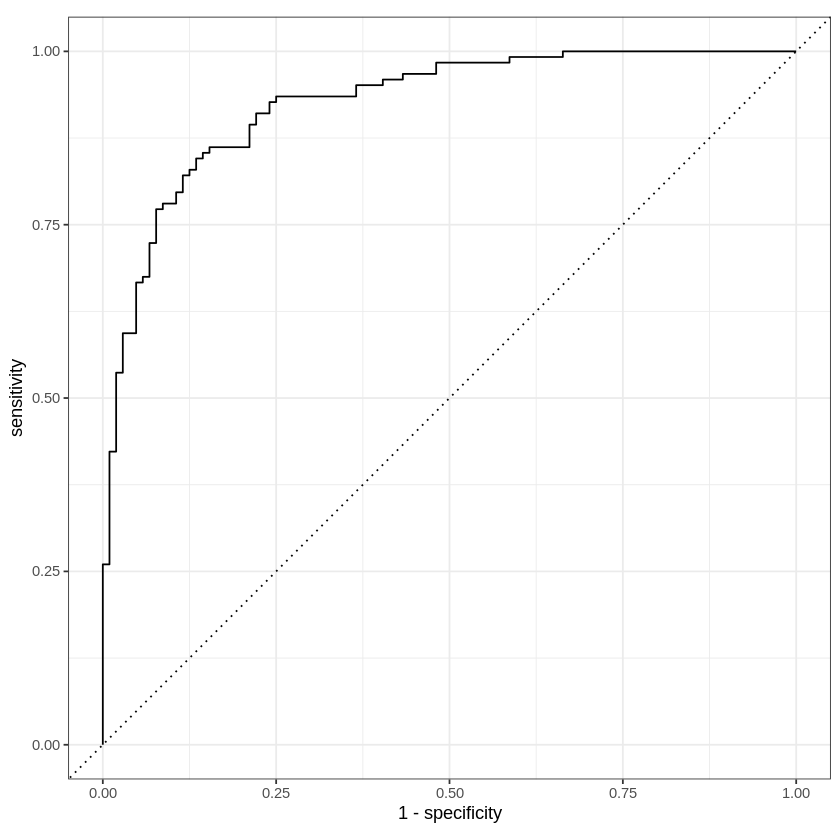

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
roc_auc,binary,0.9967949


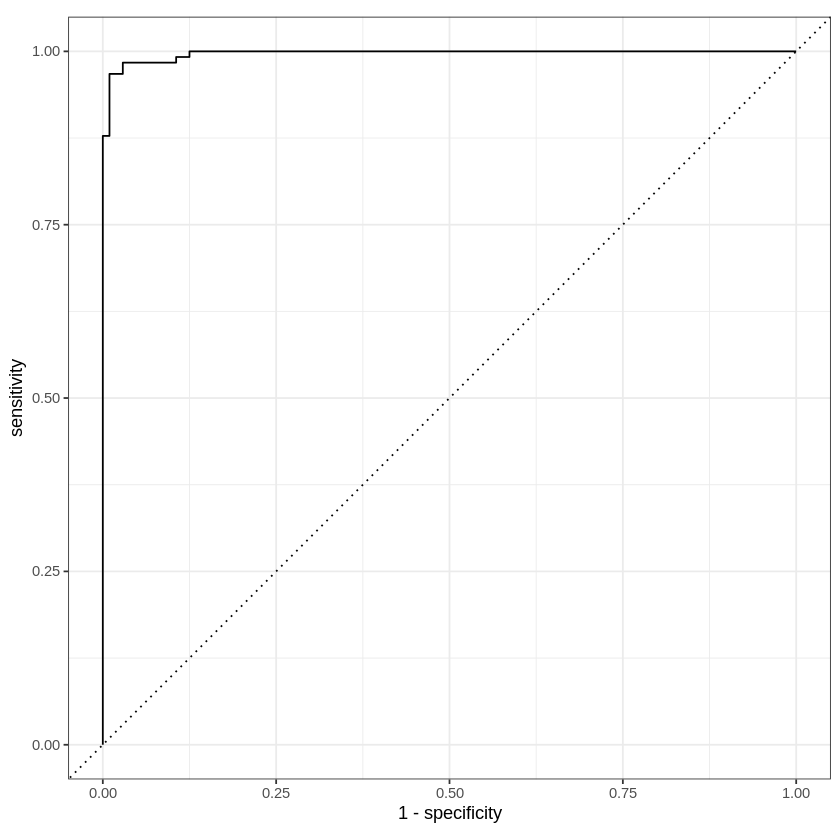

In [52]:
# logistic regression model
lr_roc_curve <- roc_curve(lr_fit_predictions, ahd, .pred_No)
roc_curve(two_class_example, truth, Class1)
autoplot(lr_roc_curve)

lr_roc_auc <- roc_auc(lr_fit_predictions, ahd, .pred_No)
lr_roc_auc


# random forest model
rf_roc_curve <- roc_curve(rf_fit_predictions, ahd, .pred_No)
rf_roc_curve
autoplot(rf_roc_curve)

rf_roc_auc <- roc_auc(rf_fit_predictions, ahd, .pred_No)
rf_roc_auc

###     The moment of truth: model performance on the test data set


In [53]:
set.seed(1234)
test_lr <- broom::augment (lr_fit, new_data = test_tbl)
test_rf <- broom::augment (rf_fit, new_data = test_tbl)


New names:
• `...1` -> `...3`
New names:
• `...3` -> `...4`
New names:
• `...1` -> `...5`
New names:
• `...1` -> `...3`
New names:
• `...3` -> `...4`
New names:
• `...1` -> `...5`


#### Confusion matrix:

In [54]:
conf_mat(test_lr, truth = ahd, estimate = `.pred_class`)
conf_mat(test_rf, truth = ahd, estimate = `.pred_class`)

          Truth
Prediction No Yes
       No  36   5
       Yes  5  30

          Truth
Prediction No Yes
       No  36   6
       Yes  5  29

#### Accuracy

In [55]:
accuracy(test_lr, truth = ahd, estimate = `.pred_class`)
accuracy(test_rf, truth = ahd, estimate = `.pred_class`)

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.8684211


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
accuracy,binary,0.8552632


#### F1 metric:

In [56]:
f_meas(test_lr, truth = ahd, estimate = `.pred_class`)
f_meas(test_rf, truth = ahd, estimate = `.pred_class`)

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
f_meas,binary,0.8780488


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
f_meas,binary,0.8674699


#### ROC curve on the test data set

.threshold,specificity,sensitivity
<dbl>,<dbl>,<dbl>
-Inf,0.00000000,1.0000000
0.001896333,0.00000000,1.0000000
0.003267452,0.02857143,1.0000000
0.003617578,0.05714286,1.0000000
0.004693389,0.08571429,1.0000000
0.006268560,0.11428571,1.0000000
0.006844781,0.14285714,1.0000000
0.010575508,0.17142857,1.0000000
0.021123709,0.20000000,1.0000000


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
roc_auc,binary,0.954007


.threshold,specificity,sensitivity
<dbl>,<dbl>,<dbl>
-Inf,0.00000000,1.0000000
0.03473889,0.00000000,1.0000000
0.06916111,0.02857143,1.0000000
0.07398651,0.05714286,1.0000000
0.09568254,0.08571429,1.0000000
0.10802143,0.11428571,1.0000000
0.10844841,0.14285714,1.0000000
0.12880794,0.17142857,1.0000000
0.13006270,0.20000000,1.0000000


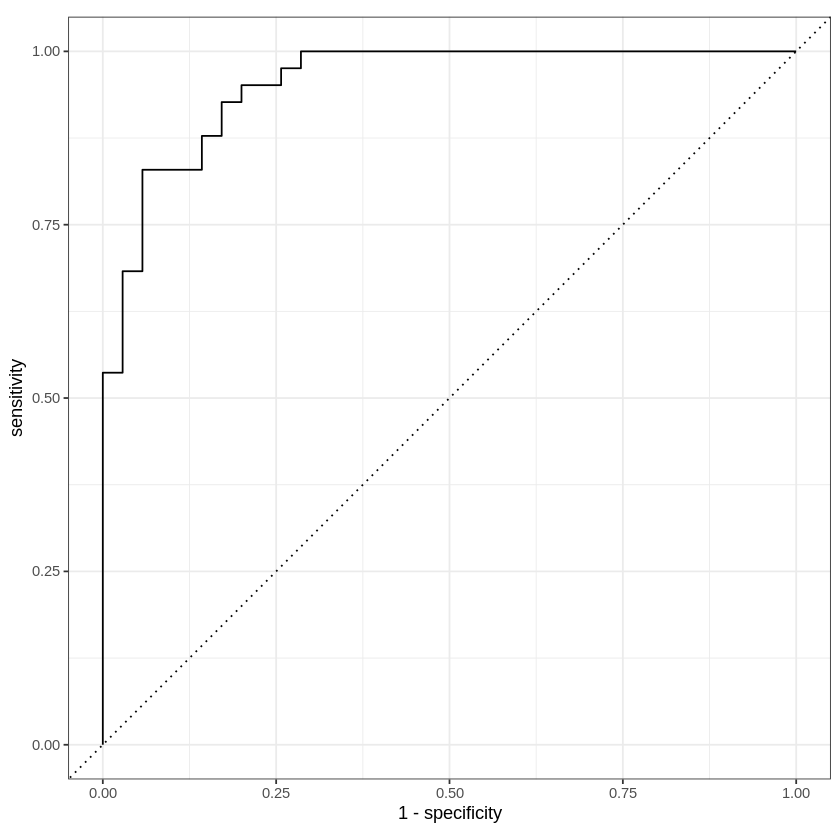

.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
roc_auc,binary,0.9484321


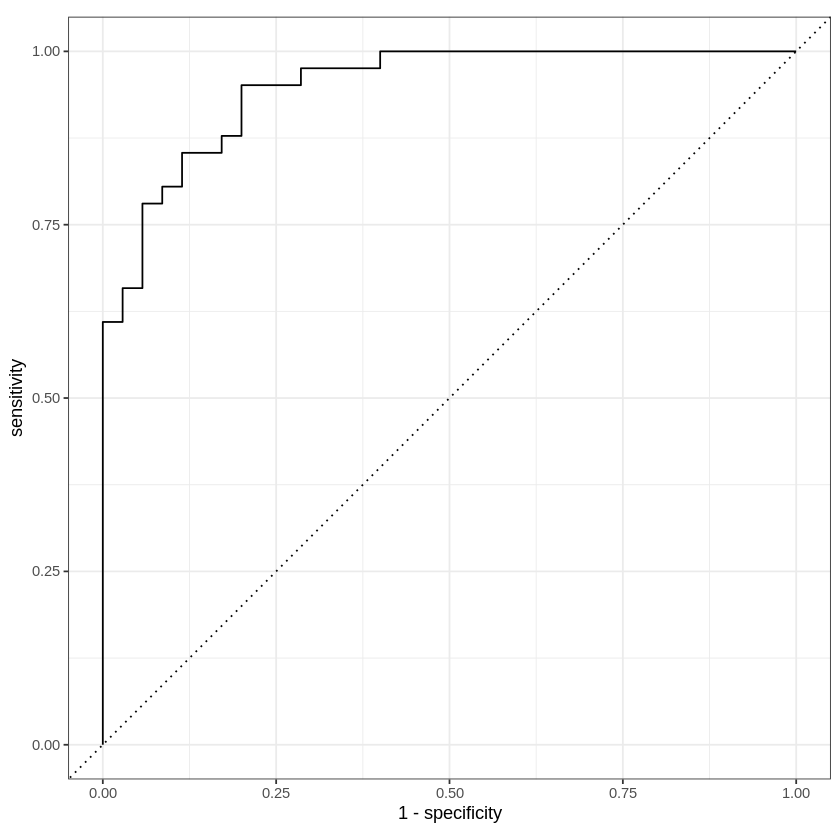

In [57]:
# logistic regression model
lr_roc_curve_test <- roc_curve(test_lr, ahd, .pred_No)
lr_roc_curve_test
autoplot(lr_roc_curve_test)

lr_roc_auc_test <- roc_auc(test_lr, ahd, .pred_No)
lr_roc_auc_test

# random forest model
rf_roc_curve_test <- roc_curve(test_rf, ahd,  .pred_No)
rf_roc_curve_test
autoplot(rf_roc_curve_test)

rf_roc_auc_test <- roc_auc(test_rf, ahd, .pred_No)
rf_roc_auc_test

### Model interpretation

#### Variable importance - Random Forest

#### Coefficients - Logistic Regression

In [58]:
# raw coefficients
lr_fit_coefficients <- broom::tidy (lr_fit)
# ..or...
lr_fit_coefficients2 <- tidy(extract_fit_parsnip(lr_fit))


# exponentiated coefficients
lr_fit_coefficients_exp <- broom::tidy (lr_fit, exponentiate = TRUE)
# ..or...
coeffs_exp <- tidy(extract_fit_parsnip(lr_fit), exponentiate = TRUE)

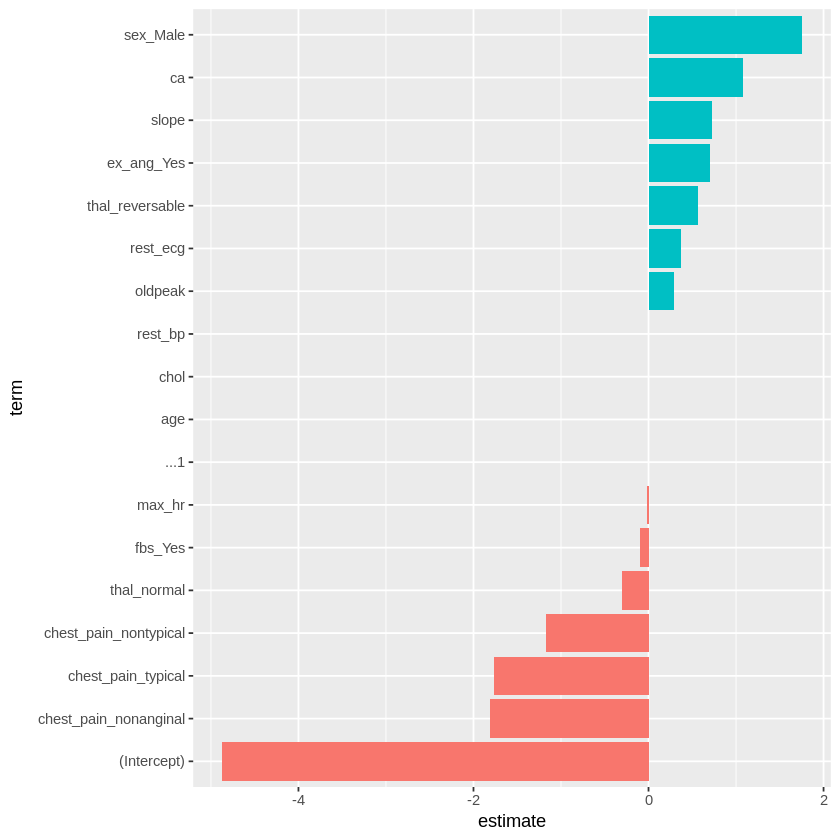

In [60]:

lr_fit %>%
    tidy() %>%
    mutate(term = fct_reorder(term, estimate)) %>%
    ggplot(aes(estimate, term, fill = estimate > 0)) +
    geom_col() +
    theme(legend.position = "none")

**Note:** Logistic regression predicts the log-odds of an outcome (e.g., probability of success/failure, 1/0).

The coefficients represent the change in log-odds for a one-unit increase in a predictor.

Interpretation: A positive coefficient increases the probability of the event happening, while a negative coefficient decreases it.

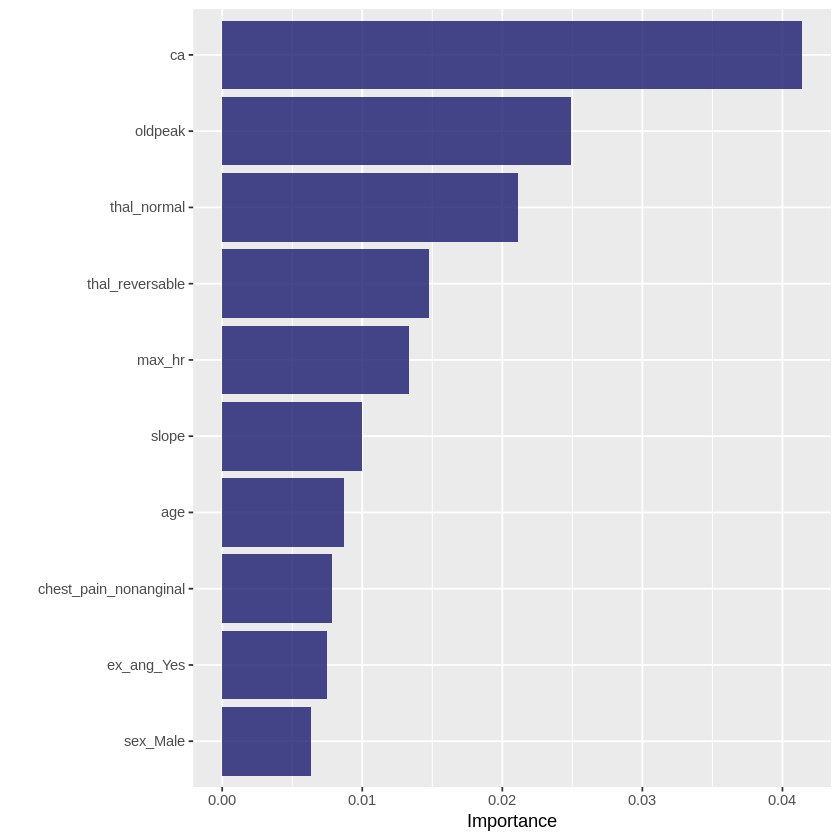

In [59]:
set.seed(1234)
rf_imp_spec <- rf_spec %>%
    set_engine("ranger", importance = "permutation")

workflow() %>%
    add_recipe(the_recipe) %>%
    add_model(rf_imp_spec) %>%
    fit(train_tbl) %>%
    extract_fit_parsnip() %>%
    vip(aesthetics = list(alpha = 0.8, fill = "midnightblue"))


---
---
---

In [24]:
## cross-validation folds
set.seed(1234)
cv_train <- vfold_cv(train_tbl, v = 5, repeats = 1, strata = ahd)
cv_train


splits                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

![](../misc/strat_cv.png)

### Assemble the workflows and fit the models

In [25]:
set.seed(1234)
lr_resamples <- workflow() %>%
    add_recipe(the_recipe) %>%
    add_model(lr_spec) %>%
    fit_resamples(resamples = cv_train, 
                  control = control_resamples(save_pred = TRUE))

In [27]:
View(lr_resamples)

splits                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

In [28]:
set.seed(1234)
rf_resamples <- workflow() %>%
    add_recipe(the_recipe) %>%
    add_model(rf_spec) %>%
    fit_resamples(resamples = cv_train, 
                  control = control_resamples(save_pred = TRUE))

# examine the resulted tibble
View(rf_resamples)

splits                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

### Explore the results

In [29]:
# performance metrics (mean) across folds for each grid line
lr_resamples %>% collect_metrics()

#  get the metrics for each resample
detailed_metrics_lr <- lr_resamples %>% collect_metrics(summarize = FALSE)
View(detailed_metrics_lr)  


.metric,.estimator,mean,n,std_err,.config
<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
accuracy,binary,0.7934396,25,0.012310112,Preprocessor1_Model1
roc_auc,binary,0.8813722,25,0.008807358,Preprocessor1_Model1


id,id2,.metric,.estimator,.estimate,.config
<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>
Repeat1,Fold1,accuracy,binary,0.7826087,Preprocessor1_Model1
Repeat1,Fold1,roc_auc,binary,0.8838095,Preprocessor1_Model1
Repeat1,Fold2,accuracy,binary,0.8695652,Preprocessor1_Model1
Repeat1,Fold2,roc_auc,binary,0.9447619,Preprocessor1_Model1
Repeat1,Fold3,accuracy,binary,0.8043478,Preprocessor1_Model1
Repeat1,Fold3,roc_auc,binary,0.8552381,Preprocessor1_Model1
Repeat1,Fold4,accuracy,binary,0.8444444,Preprocessor1_Model1
Repeat1,Fold4,roc_auc,binary,0.9246032,Preprocessor1_Model1
Repeat1,Fold5,accuracy,binary,0.6818182,Preprocessor1_Model1


In [30]:
# performance metrics (mean) across folds for each grid line
rf_resamples %>% collect_metrics()

#  get the metrics for each resample
detailed_metrics_rf <- rf_resamples %>% collect_metrics(summarize = FALSE)
View(detailed_metrics_rf)  

.metric,.estimator,mean,n,std_err,.config
<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
accuracy,binary,0.8020553,25,0.011781067,Preprocessor1_Model1
roc_auc,binary,0.8860714,25,0.008995672,Preprocessor1_Model1


id,id2,.metric,.estimator,.estimate,.config
<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>
Repeat1,Fold1,accuracy,binary,0.8043478,Preprocessor1_Model1
Repeat1,Fold1,roc_auc,binary,0.8895238,Preprocessor1_Model1
Repeat1,Fold2,accuracy,binary,0.7826087,Preprocessor1_Model1
Repeat1,Fold2,roc_auc,binary,0.9352381,Preprocessor1_Model1
Repeat1,Fold3,accuracy,binary,0.7826087,Preprocessor1_Model1
Repeat1,Fold3,roc_auc,binary,0.8742857,Preprocessor1_Model1
Repeat1,Fold4,accuracy,binary,0.9111111,Preprocessor1_Model1
Repeat1,Fold4,roc_auc,binary,0.9166667,Preprocessor1_Model1
Repeat1,Fold5,accuracy,binary,0.7272727,Preprocessor1_Model1


###     The moment of truth: model performance on the test data set


In [31]:
set.seed(1234)
test__lr <- workflow() %>%
    add_recipe(the_recipe) %>%
    add_model(lr_spec) %>%
    last_fit(splits) 

test__lr %>% collect_metrics() 

.metric,.estimator,.estimate,.config
<chr>,<chr>,<dbl>,<chr>
accuracy,binary,0.8684211,Preprocessor1_Model1
roc_auc,binary,0.9540070,Preprocessor1_Model1


In [32]:

set.seed(1234)
test__rf <- workflow() %>%
    add_recipe(the_recipe) %>%
    add_model(rf_spec) %>%
    last_fit(splits) 

test__rf %>% collect_metrics() 

.metric,.estimator,.estimate,.config
<chr>,<chr>,<dbl>,<chr>
accuracy,binary,0.8815789,Preprocessor1_Model1
roc_auc,binary,0.9505226,Preprocessor1_Model1


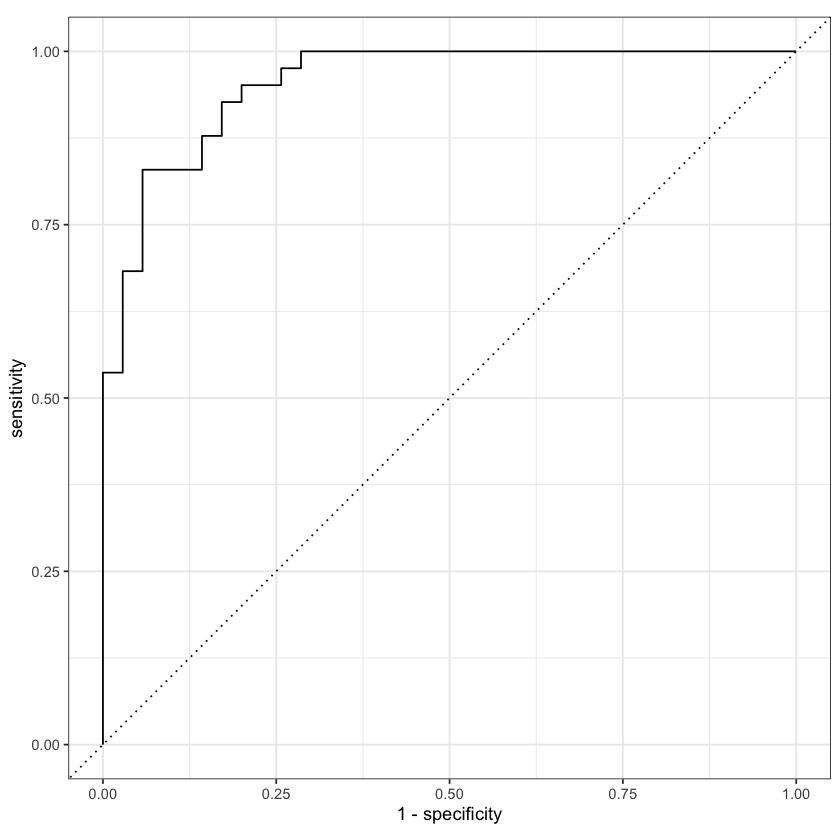

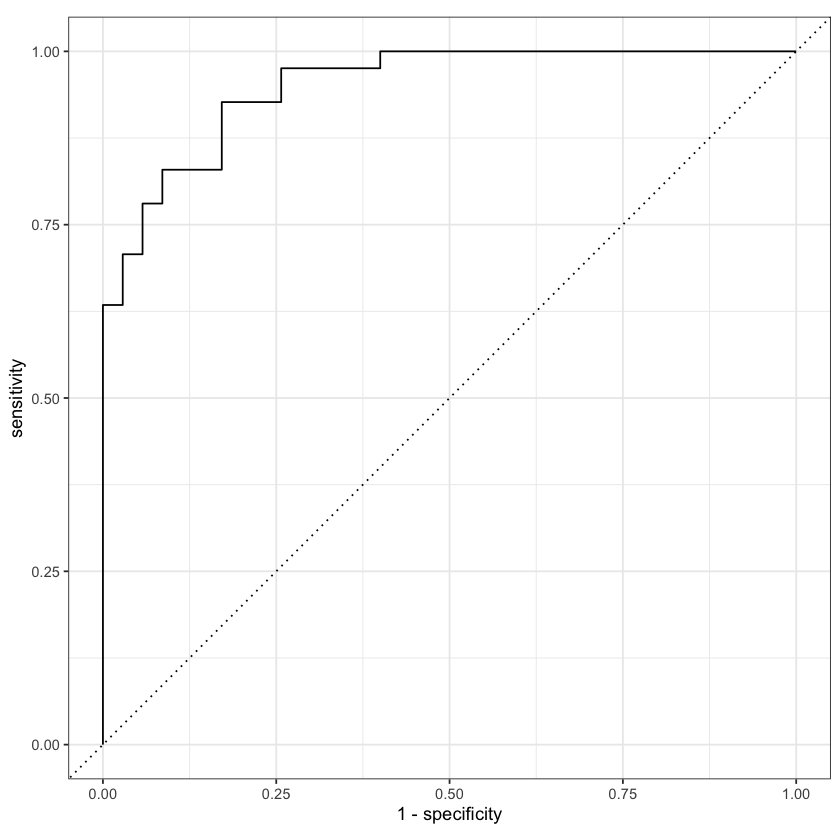

In [33]:
test__lr %>%
    unnest(`.predictions`) %>%
    roc_curve(ahd, .pred_No) %>%
    autoplot()

test__rf %>%
    unnest(`.predictions`) %>%
    roc_curve(ahd,.pred_No) %>%
    autoplot()

### Model interpretation

#### Variable importance - Random Forest

#### Coefficients - Logistic Regression

══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: logistic_reg()

── Preprocessor ────────────────────────────────────────────────────────────────
3 Recipe Steps

• step_impute_knn()
• step_dummy()
• step_zv()

── Model ───────────────────────────────────────────────────────────────────────

Call:  stats::glm(formula = ..y ~ ., family = stats::binomial, data = data)

Coefficients:
          (Intercept)                   ...1                    age  
            -4.871274               0.001654               0.003476  
              rest_bp                   chol               rest_ecg  
             0.010672               0.008134               0.367944  
               max_hr                oldpeak                  slope  
            -0.015204               0.290551               0.722264  
                   ca               sex_Male  chest_pain_nonanginal  
             1.074063               1.752365              -1.808736

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),-4.871273931,3.206932062,-1.5189826,0.1287668814
...1,0.001654401,0.002453137,0.6744020,0.5000557774
age,0.003475512,0.026904347,0.1291803,0.8972149672
rest_bp,0.010672042,0.012550856,0.8503039,0.3951561276
chol,0.008134139,0.004271683,1.9042000,0.0568841396
rest_ecg,0.367944127,0.216441807,1.6999679,0.0891369603
max_hr,-0.015203677,0.012159196,-1.2503851,0.2111589142
oldpeak,0.290551044,0.260363347,1.1159445,0.2644458931
slope,0.722264109,0.436024637,1.6564755,0.0976255715


term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),0.007663596,3.206932062,-1.5189826,0.1287668814
...1,1.001655770,0.002453137,0.6744020,0.5000557774
age,1.003481559,0.026904347,0.1291803,0.8972149672
rest_bp,1.010729192,0.012550856,0.8503039,0.3951561276
chol,1.008167311,0.004271683,1.9042000,0.0568841396
rest_ecg,1.444761314,0.216441807,1.6999679,0.0891369603
max_hr,0.984911316,0.012159196,-1.2503851,0.2111589142
oldpeak,1.337164121,0.260363347,1.1159445,0.2644458931
slope,2.059089942,0.436024637,1.6564755,0.0976255715


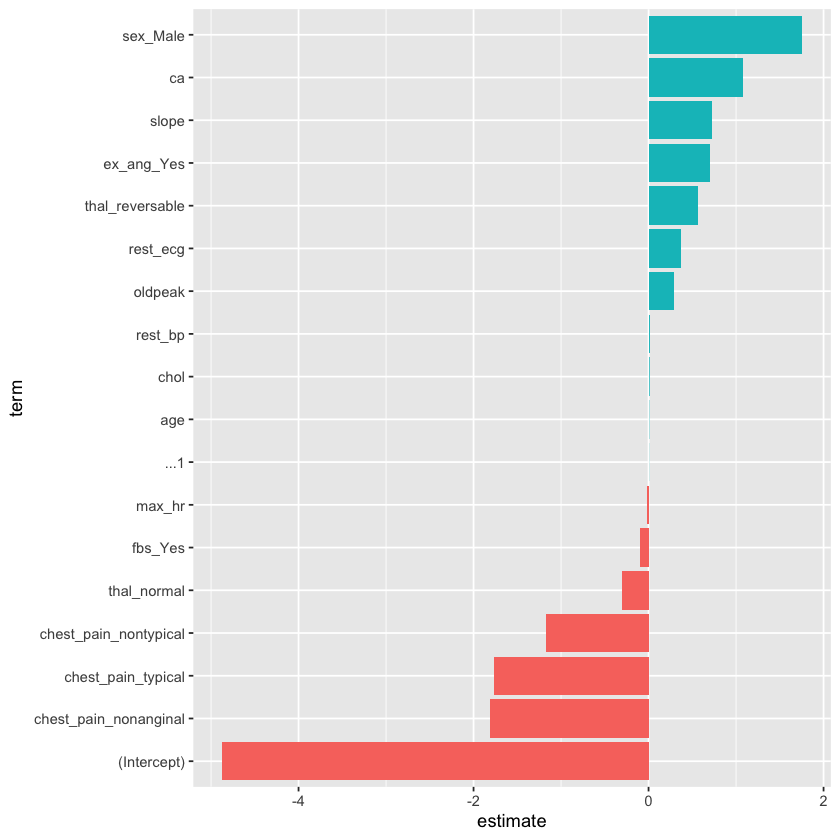

In [34]:

set.seed(1234)
lr_fit <- workflow() %>%
    add_recipe(the_recipe) %>%
    add_model(lr_spec) %>%
    fit(data = train_tbl)
lr_fit

coeffs <- tidy(extract_fit_parsnip(lr_fit))
coeffs

lr_fit %>%
    tidy() %>%
    mutate(term = fct_reorder(term, estimate)) %>%
    ggplot(aes(estimate, term, fill = estimate > 0)) +
    geom_col() +
    theme(legend.position = "none")


coeffs_exp <- tidy(extract_fit_parsnip(lr_fit), exponentiate = TRUE)
coeffs_exp

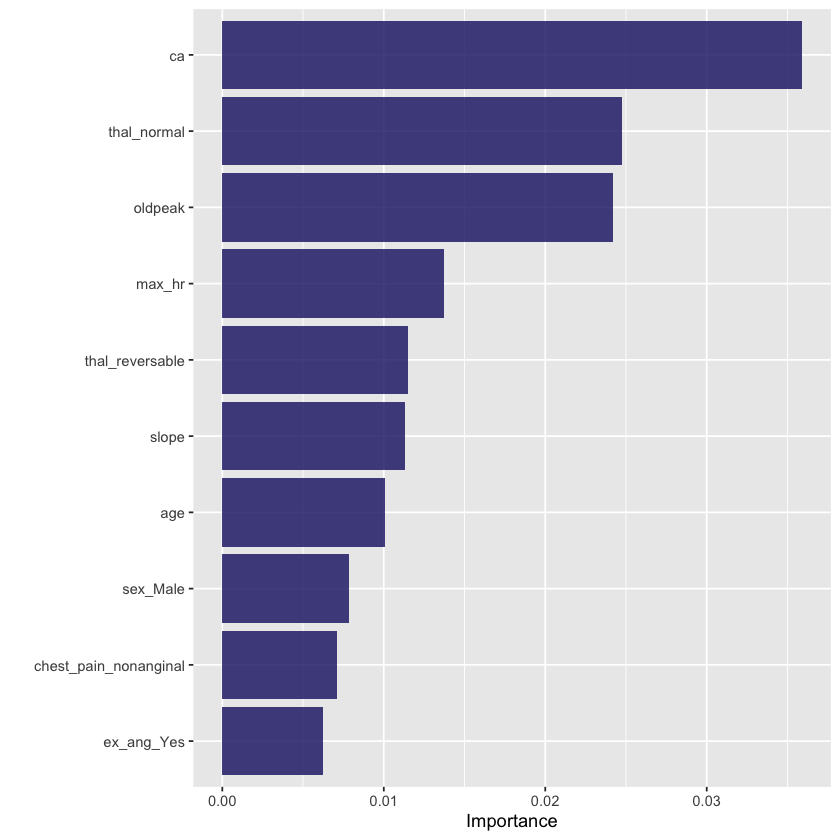

In [38]:
set.seed(1234)
rf_imp_spec <- rf_spec %>%
    set_engine("ranger", importance = "permutation")

workflow() %>%
    add_recipe(the_recipe) %>%
    add_model(rf_imp_spec) %>%
    fit(train_tbl) %>%
    extract_fit_parsnip() %>%
    vip(aesthetics = list(alpha = 0.8, fill = "midnightblue"))